In [1]:
%load_ext autoreload
%autoreload 2
import numpy as np
import os
import matplotlib.pyplot as plt
import matplotlib

%matplotlib inline


from abg_python.galaxy.gal_utils import Galaxy
from abg_python.all_utils import filterDictionary

from firestudio.studios.gas_studio import GasStudio
from firestudio.studios.star_studio import StarStudio


In [2]:
snapdir = "/scratch/projects/xsede/GalaxiesOnFIRE/metal_diffusion/m12i_res7100/output"
snapnum = 600 
galaxy = Galaxy(
    'm12i_res7100',
    snapdir,
    600,
    datadir='/scratch/04210/tg835099/data/metal_diffusion')

hi_z_galaxy = Galaxy(
    'm12i_res7100',
    snapdir,
    293,
    datadir='/scratch/04210/tg835099/data/metal_diffusion')

Couldn't find a metadata file... for
 Metadata object at /scratch/04210/tg835099/data/metal_diffusion/m12i_res7100/metadata/meta_Galaxy_600.hdf5
Couldn't find a metadata file... for
 Metadata object at /scratch/04210/tg835099/data/metal_diffusion/m12i_res7100/metadata/meta_Galaxy_293.hdf5


In [3]:
galaxy.extractMainHalo()
hi_z_galaxy.extractMainHalo()

Using the saved sub-snapshots
Successfully loaded a pre-extracted subsnap
Reorienting...
Done.
extract_halo_inner(m12i_res7100_md at 600,){'orient_stars': True} 21.49 s elapsed
Snapshot memory free
Using the saved sub-snapshots
Successfully loaded a pre-extracted subsnap
Reorienting...
Done.
extract_halo_inner(m12i_res7100_md at 293,){'orient_stars': True} 13.17 s elapsed
Snapshot memory free


(19.994203049168693,
 True,
 1.4508937163444764,
 1.9826900352390529,
 1851002966124.838,
 11555541570080.148,
 156.24353719489022,
 3.9988406098337386)

In [4]:
## let's put the FIREstudio projections into a subuse_defaults=irectory of our Galaxy class instance
studio_datadir = os.path.join(os.path.dirname(galaxy.datadir),'firestudio')

## initialize the GasStudio instance
my_gasStudio = GasStudio(
    studio_datadir,
    galaxy.snapnum,
    studio_datadir,
    gas_snapdict=galaxy.sub_snap, ## pass in snapshot dictionary
    star_snapdict=galaxy.sub_star_snap, ## pass in snapshot dictionary
    )

## initialize the GasStudio instance
hi_z_my_gasStudio = GasStudio(
    studio_datadir,
    hi_z_galaxy.snapnum,
    studio_datadir,
    gas_snapdict=hi_z_galaxy.sub_snap, ## pass in snapshot dictionary
    star_snapdict=hi_z_galaxy.sub_star_snap, ## pass in snapshot dictionary
    )

snapnum ignored. Did you mean something else? dict_keys(['use_colorbar', 'cbar_label', 'cbar_logspace'])
sim_name ignored. Did you mean something else? dict_keys(['use_colorbar', 'cbar_label', 'cbar_logspace'])
setting use_colorbar to default value of: False
setting cbar_label to default value of: 
setting cbar_logspace to default value of: True
setting snapnum to user value of: 600
setting sim_name to user value of: /scratch/04210/tg835099/data/metal_diffusion/firestudio
setting frame_half_width to default value of: 15
setting frame_half_thickness to default value of: 15
setting frame_center to default value of: [0. 0. 0.]
setting theta to default value of: 0
setting phi to default value of: 0
setting psi to default value of: 0
setting aspect_ratio to default value of: 1
setting pixels to default value of: 1200
setting figure_label to default value of: 
setting scale_bar to default value of: True
setting scale_line_length to default value of: 5
setting noaxis to default value of: True

In [5]:
def plot_quiver_vels(this_galaxy,ax,slice_width=None):
    vels = this_galaxy.sub_snap['Velocities']
    masses = this_galaxy.sub_snap['Masses']
    coords = this_galaxy.sub_snap['Coordinates']
    if slice_width is not None:
        zmask = np.abs(coords[:,1])<slice_width
        vels = vels[zmask]
        masses = masses[zmask]
        coords = coords[zmask]

    xs,zs = coords[:,0],coords[:,-1]
    print('thickness: +-',np.max(coords[:,1]))
    xedges=np.linspace(-15,15,30/1)
    zedges=np.linspace(-6,6,12/1)

    xedges=np.arange(-15,15+1,1)
    zedges=np.arange(-10,10+1,1)

    mass_map,xedges,zedges = np.histogram2d(xs,zs,bins=[xedges,zedges],weights=masses)
    vx_map,xedges,zedges = np.histogram2d(xs,zs,bins=[xedges,zedges],weights=masses*vels[:,0])
    vz_map,xedges,zedges = np.histogram2d(xs,zs,bins=[xedges,zedges],weights=masses*vels[:,-1])

    vx_map[mass_map>0]=vx_map[mass_map>0]/mass_map[mass_map>0]
    vz_map[mass_map>0]=vz_map[mass_map>0]/mass_map[mass_map>0]


    xcs = (xedges[1:]+xedges[:-1])/2
    zcs = (zedges[1:]+zedges[:-1])/2

    X,Z = np.meshgrid(xcs,zcs)

    #ax.quiver(X.T,Z.T,vx_map,vz_map,color='white',width=0.00125*3)
    ax.streamplot(X,Z,vx_map.T,vz_map.T,color='white',density=1,linewidth=0.5)

In [6]:
import matplotlib.gridspec as gridspec

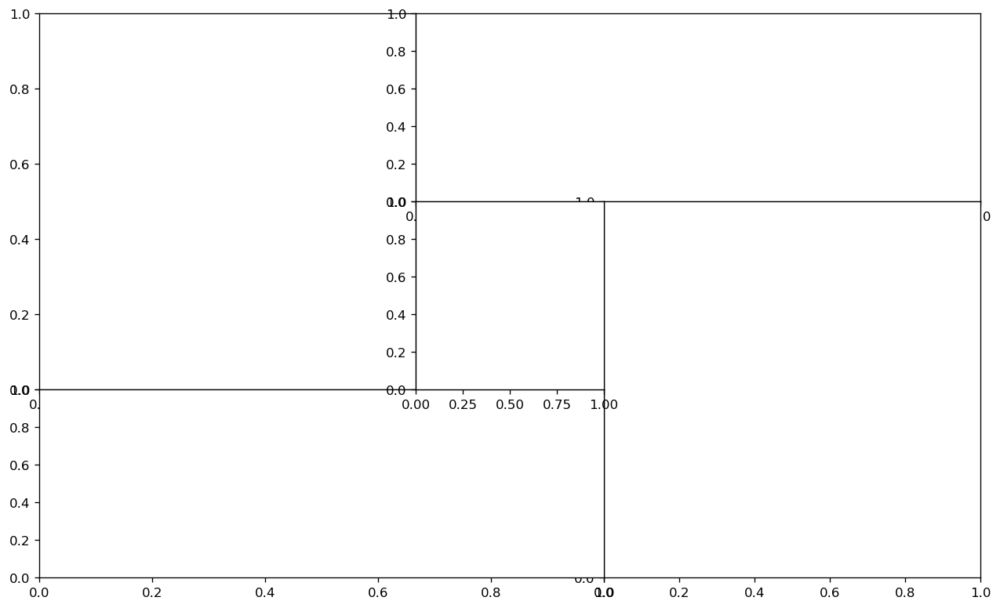

In [7]:
gs = gridspec.GridSpec(3,5)
fig = plt.figure()
axs = [fig.add_subplot(gs[:2,:2])]
axs +=[fig.add_subplot(gs[0,2:5])]
axs +=[fig.add_subplot(gs[1:3,3:5,])]
axs +=[fig.add_subplot(gs[2,:3,])]
axs +=[fig.add_subplot(gs[1,2])]
                       
axs = np.array(axs)

gs.update(wspace=0,hspace=0,left=0,right=1,top=1,bottom=0)
fig.set_size_inches(5*2,3*2)
fig.set_dpi(120)
fig.set_facecolor('white')

scale_bar ignored. Did you mean something else? dict_keys(['use_colorbar', 'cbar_label', 'cbar_logspace'])
theta ignored. Did you mean something else? dict_keys(['use_colorbar', 'cbar_label', 'cbar_logspace'])
aspect_ratio ignored. Did you mean something else? dict_keys(['use_colorbar', 'cbar_label', 'cbar_logspace'])
frame_half_thickness ignored. Did you mean something else? dict_keys(['use_colorbar', 'cbar_label', 'cbar_logspace'])
setting scale_bar to user value of: False
setting theta to user value of: 0
setting aspect_ratio to user value of: 1
setting frame_half_thickness to user value of: 15
cache npix1200_width30.00kpc_depth15.00kpc_x0.00_y0.00_z0.00_theta0.00_phi0.00_psi0.00_aspect1.00 inner_weight_along_los(GasStudio instance, None, 'Masses', None, 'Temperature'){} success!
min_Masses =  -0.5
max_Masses =  3
Image range (Masses):  -0.965189 3.096508
Image range (8bit):  0.0 255.0


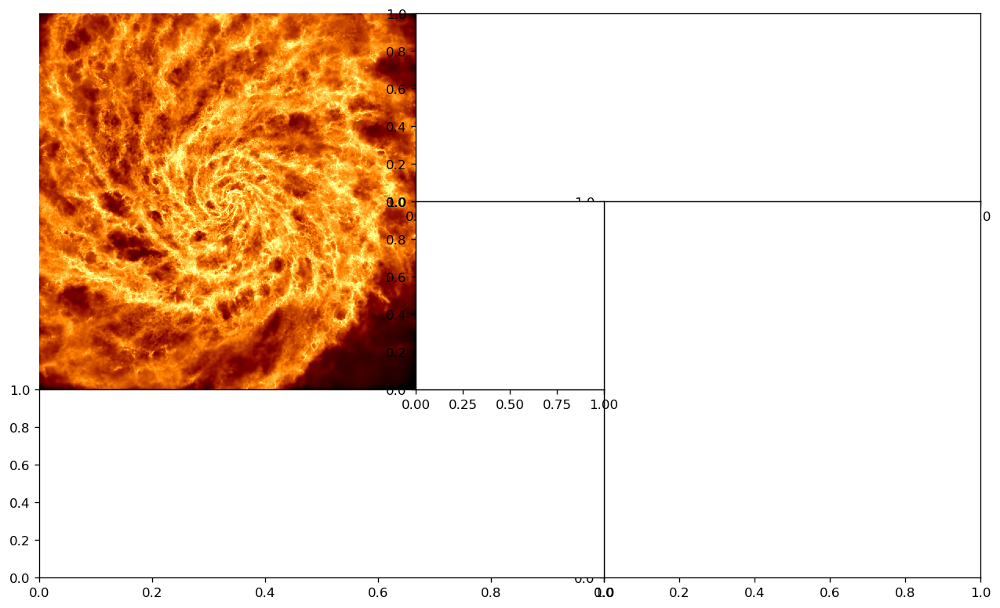

In [8]:
ax = axs[0]
my_gasStudio.set_ImageParams(
    scale_bar=False,
    theta=0,
    aspect_ratio=1,
    frame_half_thickness=15)
pixels = my_gasStudio.render(
    ax,
    weight_name='Masses',
    quantity_name='Temperature',
#    min_quantity=3,
#    max_quantity=6.5,
    quantity_adjustment_function=np.log10,    
    min_weight=-0.5,
    max_weight=3,
    weight_adjustment_function=lambda x: np.log10(x/my_gasStudio.Acell) + 10 - 6, ## msun/pc^2
    cmap='afmhot')
fig

frame_half_thickness ignored. Did you mean something else? dict_keys(['use_colorbar', 'cbar_label', 'cbar_logspace'])
aspect_ratio ignored. Did you mean something else? dict_keys(['use_colorbar', 'cbar_label', 'cbar_logspace'])
theta ignored. Did you mean something else? dict_keys(['use_colorbar', 'cbar_label', 'cbar_logspace'])
setting use_colorbar to user value of: False
scale_bar ignored. Did you mean something else? dict_keys(['cbar_label', 'cbar_logspace'])
setting frame_half_thickness to user value of: 0.25
setting aspect_ratio to user value of: 0.3333333333333333
setting theta to user value of: 90
use_colorbar ignored. Did you mean something else? dict_keys(['frame_half_width', 'frame_center', 'phi', 'psi', 'pixels', 'figure_label', 'scale_bar', 'scale_line_length', 'noaxis', 'savefig', 'fontsize', 'snapdir', 'snapnum', 'sim_name'])
setting scale_bar to user value of: False
use_colorbar = False
cbar_label = 
cbar_logspace = True
frame_half_width = 15
frame_half_thickness = 0.25


/home1/04210/tg835099/python/firestudio/studios/gas_studio.py:459: RuntimeWarning: divide by zero encountered in log10
  weightWeightedQuantityMap = quantity_adjustment_function(weightWeightedQuantityMap)


thickness: +- 0.24999918629955836


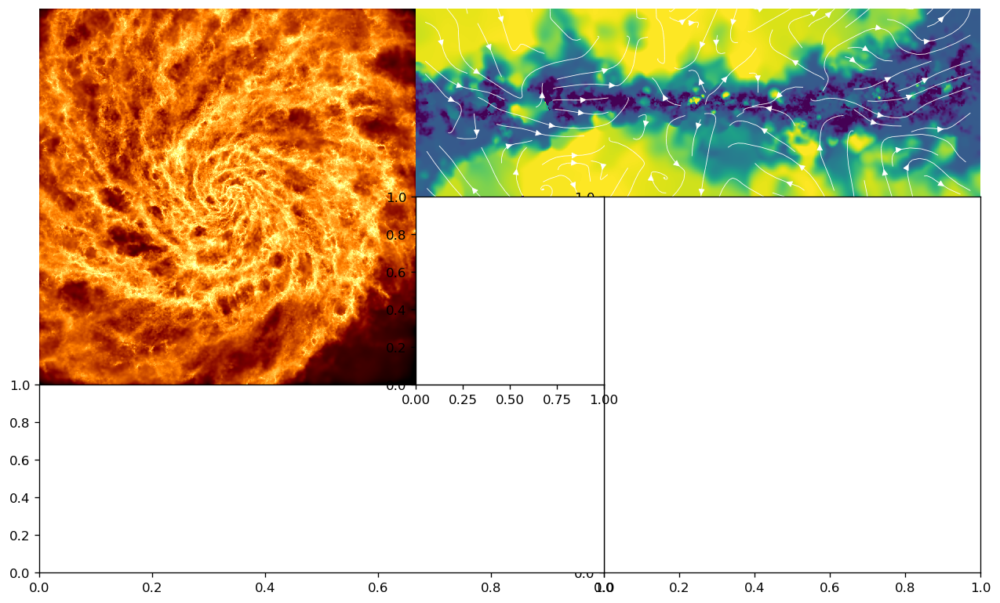

In [9]:
ax = axs[1]
my_gasStudio.set_ImageParams(frame_half_thickness=0.25,aspect_ratio=1/3,theta=90,use_colorbar=False,scale_bar=False)
my_gasStudio.print_ImageParams()
pixels = my_gasStudio.render(
    ax,
    weight_name='Masses',
    quantity_name='Temperature',
    min_quantity=3,
    max_quantity=6.5,
    quantity_adjustment_function=np.log10,    
#    min_weight=-0.5,
#    max_weight=3,
#    weight_adjustment_function=lambda x: np.log10(x/my_gasStudio.Acell) + 10 - 6, ## msun/pc^2
    cmap='viridis') 

plot_quiver_vels(galaxy,ax,0.25)
ax.set_ylim(-5,5)
fig

aspect_ratio ignored. Did you mean something else? dict_keys(['use_colorbar', 'cbar_label', 'cbar_logspace'])
frame_half_thickness ignored. Did you mean something else? dict_keys(['use_colorbar', 'cbar_label', 'cbar_logspace'])
theta ignored. Did you mean something else? dict_keys(['use_colorbar', 'cbar_label', 'cbar_logspace'])
scale_bar ignored. Did you mean something else? dict_keys(['use_colorbar', 'cbar_label', 'cbar_logspace'])
setting aspect_ratio to user value of: 1
setting frame_half_thickness to user value of: 15
setting theta to user value of: 180
setting scale_bar to user value of: False
cache npix1200_width30.00kpc_depth15.00kpc_x0.00_y0.00_z0.00_theta180.00_phi0.00_psi0.00_aspect1.00 inner_weight_along_los(GasStudio instance, None, 'Masses', array([ -99.89142413, -216.79214392, -170.87231327, ...,  -95.79544726,
        -99.83215249,  -84.96152466]), 'vr'){} success!
min_vr =  -100
max_vr =  100
Image range (vr):  -187.16737 572.938
Image range (8bit):  0.0 255.0


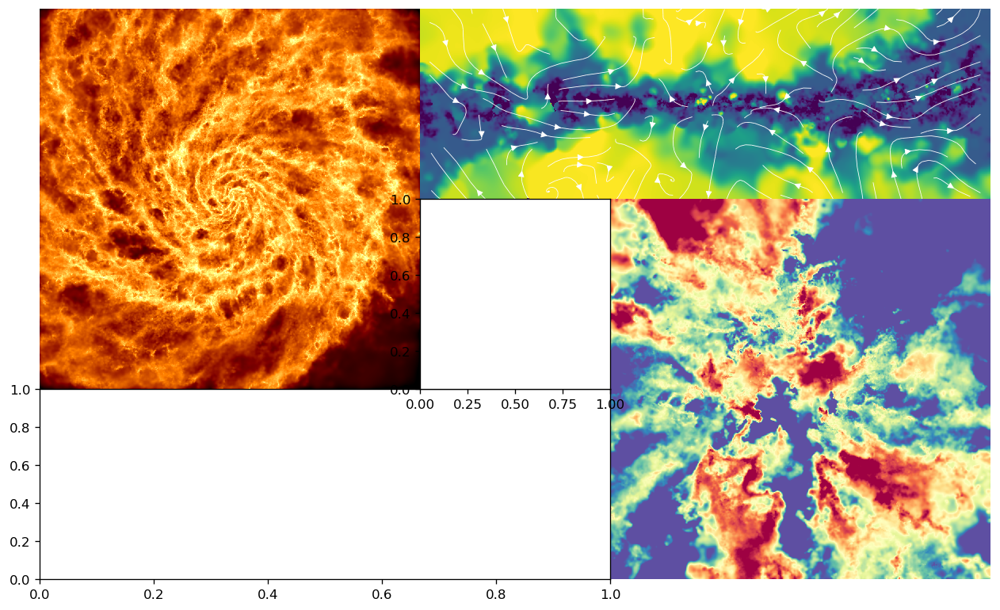

In [10]:
ax = axs[2]
hi_z_my_gasStudio.set_ImageParams(
    aspect_ratio=1,
    frame_half_thickness=15,
    theta=180,
    scale_bar=False)

rhats = hi_z_galaxy.sub_snap['Coordinates']/np.linalg.norm(hi_z_galaxy.sub_snap['Coordinates'],axis=1)[:,None]
vrs = np.sum(rhats*hi_z_galaxy.sub_snap['Velocities'],axis=1)
## compute mass weighted radial velocity. 
##  pass vrs in as an array using quantities
pixels = hi_z_my_gasStudio.render(
    ax,
    weight_name='Masses',
    quantity_name='vr',
    quantities=vrs,
    min_quantity =-100,
    max_quantity= 100,
    cmap='Spectral')

fig

snapnum ignored. Did you mean something else? dict_keys(['maxden', 'dynrange', 'color_scheme_nasa'])
sim_name ignored. Did you mean something else? dict_keys(['maxden', 'dynrange', 'color_scheme_nasa'])
theta ignored. Did you mean something else? dict_keys(['maxden', 'dynrange', 'color_scheme_nasa'])
aspect_ratio ignored. Did you mean something else? dict_keys(['maxden', 'dynrange', 'color_scheme_nasa'])
scale_bar ignored. Did you mean something else? dict_keys(['maxden', 'dynrange', 'color_scheme_nasa'])
setting maxden to default value of: None
setting dynrange to default value of: None
setting color_scheme_nasa to default value of: True
setting snapnum to user value of: 600
setting sim_name to user value of: m12i_res7100
setting theta to user value of: 90
setting aspect_ratio to user value of: 0.3333333333333333
setting scale_bar to user value of: False
setting frame_half_width to default value of: 15
setting frame_half_thickness to default value of: 15
setting frame_center to defaul

/home1/04210/tg835099/python/firestudio/studios/star_studio.py:325: RuntimeWarning: divide by zero encountered in log10
  rats = np.log10(all_bands.flatten())
/home1/04210/tg835099/python/firestudio/utils/stellar_utils/make_threeband_image.py:129: RuntimeWarning: divide by zero encountered in log10
  f_i = np.log10(i/minnorm) / np.log10(maxnorm/minnorm);
/home1/04210/tg835099/python/firestudio/utils/stellar_utils/make_threeband_image.py:137: RuntimeWarning: divide by zero encountered in log
  r = np.log(r/minnorm) / np.log(maxnorm/minnorm);
/home1/04210/tg835099/python/firestudio/utils/stellar_utils/make_threeband_image.py:138: RuntimeWarning: divide by zero encountered in log
  g = np.log(g/minnorm) / np.log(maxnorm/minnorm);
/home1/04210/tg835099/python/firestudio/utils/stellar_utils/make_threeband_image.py:139: RuntimeWarning: divide by zero encountered in log
  b = np.log(b/minnorm) / np.log(maxnorm/minnorm);


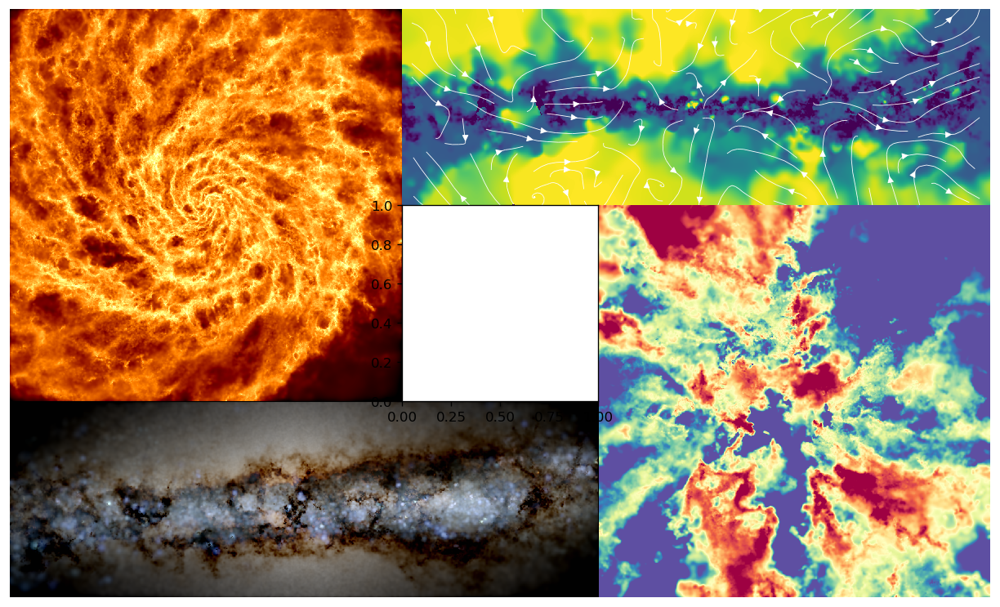

<Figure size 432x288 with 0 Axes>

In [11]:
ax = axs[3]
plt.figure()
studio_datadir = os.path.join(os.path.dirname(galaxy.datadir),'firestudio')

my_starStudio = StarStudio(
    studio_datadir,
    galaxy.snapnum,
    galaxy.datadir_name,
    gas_snapdict=galaxy.sub_snap,
    star_snapdict=galaxy.sub_star_snap,
    theta=90,
    aspect_ratio=1/3,
    scale_bar=False
    )
my_starStudio.render(ax)
fig

In [ ]:
134148
610934

610934


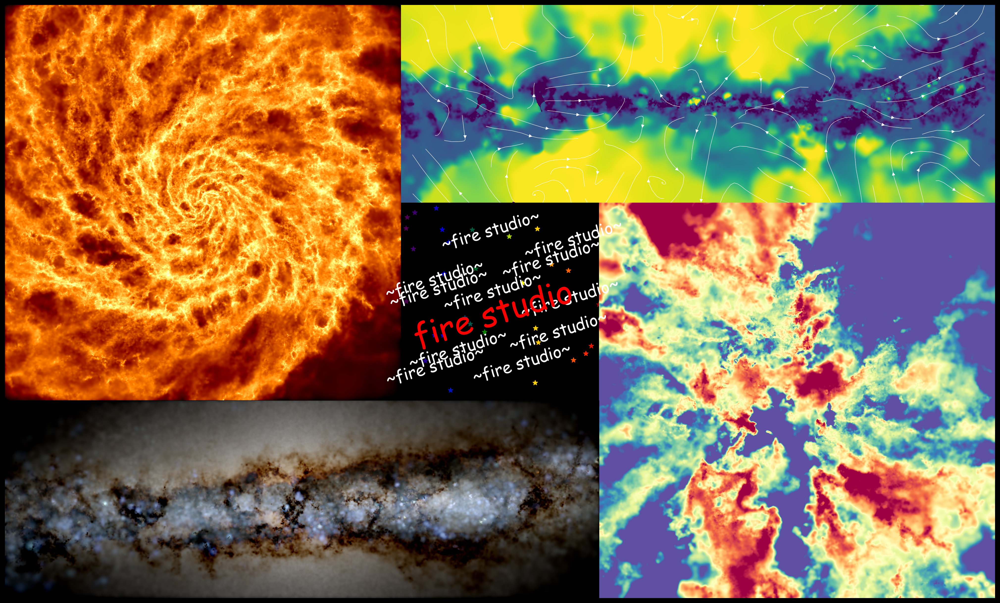

In [12]:
ax = axs[-1]
#plt.figure()
#ax = plt.gca()
for child in ax.get_children():
    try:
        child.remove()
    except:
        pass
seed = 610934#np.random.randint(1e6)
np.random.seed(seed)
print(seed)
prop = matplotlib.font_manager.FontProperties(fname='/home1/04210/tg835099/src/ComicSans.ttf')
xs,ys = (np.random.rand(2,16)*0.75+0.125)



xs = np.concatenate([xs[:4],xs[6:8],xs[9:10],xs[11:16]])
ys = np.concatenate([ys[:4],ys[6:8],ys[9:10],ys[11:16]])

star_xs,star_ys = (np.random.rand(2,30))
ax.scatter(star_xs,star_ys,marker='*',s=50,c=star_xs,zorder=-2,cmap='rainbow')
ax.set_xlim(0,1)
ax.set_ylim(0,1)
for i,(x,y) in enumerate(zip(xs,ys)):
    if i != 0:
        ax.text(x,y,'~fire studio~',transform=ax.transAxes,fontproperties=prop,size=24,va='center',ha='center',rotation=17,color='white',zorder=-1)
    else:
        ax.text(x,y,'fire studio',transform=ax.transAxes,fontproperties=prop,size=48,va='center',ha='center',rotation=17,color='red',zorder=1)
ax.set_aspect(1)
ax.set_facecolor('black')
ax.axis('off')
fig.set_size_inches(5*4,3*4)
fig.set_dpi(200)
fig.set_facecolor('black')
fig

In [13]:
fig.savefig('../src/final.png',dpi=300,facecolor='k',pad_inches=False,bbox_inches='tight')